In [2]:
from __future__ import absolute_import, division, print_function

!pip install tensorflow-gpu==2.0.0-alpha0
import tensorflow as tf

import os
import time
import matplotlib.pyplot as plt
from IPython.display import clear_output

In [3]:
_URL = 'https://people.eecs.berkeley.edu/~tinghuiz/projects/pix2pix/datasets/facades.tar.gz'

path_to_zip = tf.keras.utils.get_file('facades.tar.gz',
                                      origin=_URL, 
                                      extract=True)

PATH = os.path.join(os.path.dirname(path_to_zip), 'facades/')

30171136/30168306 [==============================] - 8s 0us/step


In [0]:
BUFFER_SIZE = 400
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [0]:
def load(image_file):
  image = tf.io.read_file(image_file)
  image = tf.image.decode_jpeg(image)

  w = tf.shape(image)[1]

  w = w // 2
  real_image = image[:, :w, :]
  input_image = image[:, w:, :]

  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)
  
  return input_image, real_image

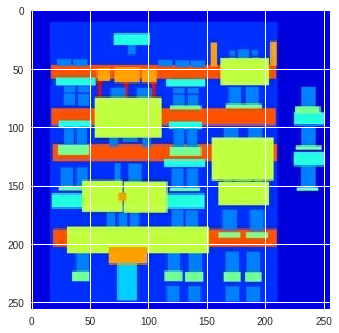

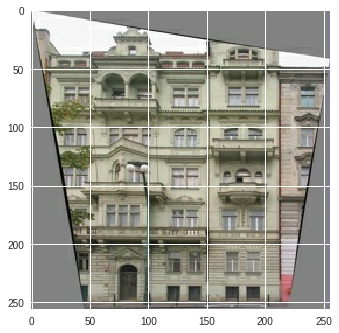

In [6]:
inp, re = load(PATH+'train/100.jpg')
# casting to int for matplotlib to show the image
plt.figure()
plt.imshow(inp/255.0)
plt.figure()
plt.imshow(re/255.0)

In [0]:

def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width], 
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width], 
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  
  return input_image, real_image

In [0]:

def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])
  
  return cropped_image[0], cropped_image[1]

In [0]:
def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1
  
  return input_image, real_image

In [0]:
@tf.function()
def random_jitter(input_image, real_image):
  # resizing to 286 x 286 x 3
  input_image, real_image = resize(input_image, real_image, 286, 286)

  # randomly cropping to 256 x 256 x 3
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)
    
  return input_image, real_image

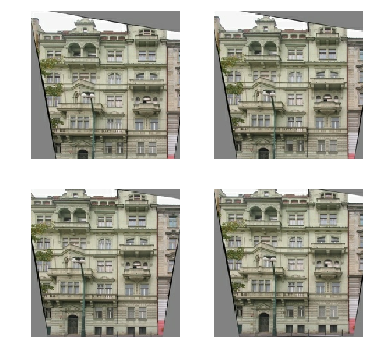

In [11]:
plt.figure(figsize=(6, 6))
for i in range(4):
  rj_inp, rj_re = random_jitter(inp, re)  
  plt.subplot(2, 2, i+1)
  plt.imshow(rj_re/255.0)
  plt.axis('off')
plt.show()

In [0]:

def load_image_train(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [0]:
def load_image_test(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = resize(input_image, real_image, 
                                   IMG_HEIGHT, IMG_WIDTH) 
  input_image, real_image = normalize(input_image, real_image)
 
  return input_image, real_image

In [0]:

train_dataset = tf.data.Dataset.list_files(PATH+'train/*.jpg')
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.map(load_image_train, 
                                  num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.batch(1)

In [0]:
test_dataset = tf.data.Dataset.list_files(PATH+'test/*.jpg')
# shuffling so that for every epoch a different image is generated 
# to predict and display the progress of our model.
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(1)

In [0]:
OUTPUT_CHANNELS = 3

In [0]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())
    
  result.add(tf.keras.layers.LeakyReLU())

  return result

In [0]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same', 
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())
  
  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [19]:

down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(inp, 0))
print (down_result.shape)

(1, 128, 128, 3)


In [20]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 256, 256, 3)


In [0]:
def Generator():
  down_stack = [
    downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
    downsample(128, 4), # (bs, 64, 64, 128)
    downsample(256, 4), # (bs, 32, 32, 256)
    downsample(512, 4), # (bs, 16, 16, 512)
    downsample(512, 4), # (bs, 8, 8, 512)
    downsample(512, 4), # (bs, 4, 4, 512)
    downsample(512, 4), # (bs, 2, 2, 512)
    downsample(512, 4), # (bs, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 512)
    upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 512)
    upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 512)
    upsample(512, 4), # (bs, 16, 16, 512)
    upsample(256, 4), # (bs, 32, 32, 256)
    upsample(128, 4), # (bs, 64, 64, 128)
    upsample(64, 4), # (bs, 128, 128, 64)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4, 
                                         strides=2, 
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh') # (bs, 256, 256, 3)

  concat = tf.keras.layers.Concatenate() 

  inputs = tf.keras.layers.Input(shape=[None,None,3])
  x = inputs
  
  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    
    x = concat([x, skip])
    

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

W0319 06:01:26.268510 140607115024256 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


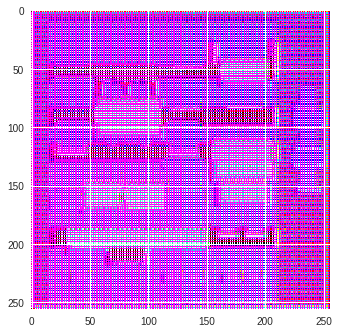

In [22]:
generator = Generator()

gen_output = generator(inp[tf.newaxis,...], training=False)
plt.imshow(gen_output[0,...])

In [0]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[None, None, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[None, None, 3], name='target_image')
  
  x = tf.keras.layers.concatenate([inp, tar]) # (bs, 256, 256, channels*2)
  
  down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
  down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
  down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1, 
                                kernel_initializer=initializer, 
                                use_bias=False)(zero_pad1) # (bs, 31, 31, 512)
  
  batchnorm1 = tf.keras.layers.BatchNormalization()(conv) 

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)
  
  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)
  
  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)
  
  return tf.keras.Model(inputs=[inp, tar], outputs=last)

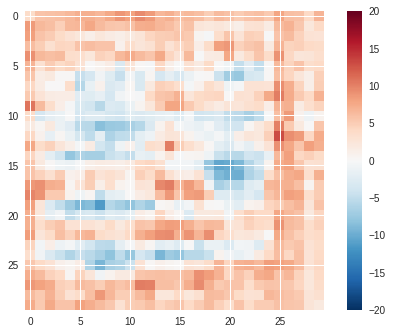

In [24]:
discriminator = Discriminator()
disc_out = discriminator([inp[tf.newaxis,...], gen_output], training=False)
plt.imshow(disc_out[0,...,-1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

In [0]:
LAMBDA = 100
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)


In [0]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)
  
  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

In [0]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)
  
  # mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss

In [0]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [0]:

checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [0]:

def generate_images(model, test_input, tar):
  # the training=True is intentional here since
  # we want the batch statistics while running the model
  # on the test dataset. If we use training=False, we will get 
  # the accumulated statistics learned from the training dataset
  # (which we don't want)
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15,15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

In [0]:
@tf.function
def train_step(input_image, target):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_loss, 
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss, 
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients, 
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients, 
                                              discriminator.trainable_variables))

In [0]:
def train(dataset, epochs):  
  for epoch in range(epochs):
    start = time.time()

    for input_image, target in dataset:
      train_step(input_image, target)
      
#     clear_output(wait=True)
    
    # saving (checkpoint) the model every 20 epochs
    if (epoch + 1) % 20 == 0:
      checkpoint.save(file_prefix = checkpoint_prefix)
      for inp, tar in test_dataset.take(1):
        generate_images(generator, inp, tar)
          

    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                        time.time()-start))

Time taken for epoch 1 is 81.13410806655884 sec

Time taken for epoch 2 is 66.12237310409546 sec

Time taken for epoch 3 is 66.18791317939758 sec

Time taken for epoch 4 is 66.18932437896729 sec

Time taken for epoch 5 is 66.19895052909851 sec

Time taken for epoch 6 is 66.12844896316528 sec

Time taken for epoch 7 is 66.2404990196228 sec

Time taken for epoch 8 is 66.22942113876343 sec

Time taken for epoch 9 is 66.3511893749237 sec

Time taken for epoch 10 is 66.22863936424255 sec

Time taken for epoch 11 is 66.21407389640808 sec

Time taken for epoch 12 is 66.22586870193481 sec

Time taken for epoch 13 is 66.25442433357239 sec

Time taken for epoch 14 is 66.23790097236633 sec

Time taken for epoch 15 is 66.21313333511353 sec

Time taken for epoch 16 is 66.23096013069153 sec

Time taken for epoch 17 is 66.32770919799805 sec

Time taken for epoch 18 is 66.32426476478577 sec

Time taken for epoch 19 is 66.29373860359192 sec



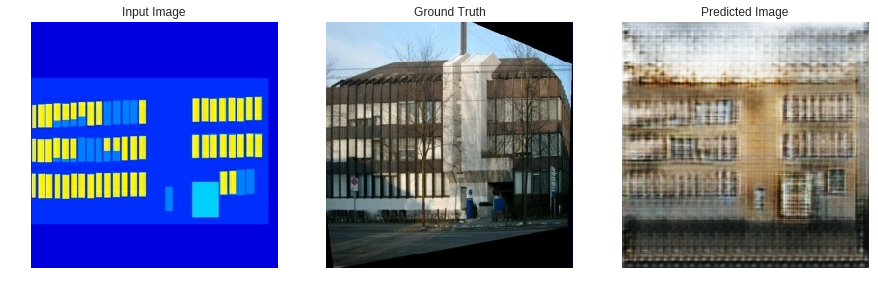

Time taken for epoch 20 is 71.21748518943787 sec

Time taken for epoch 21 is 66.39901447296143 sec

Time taken for epoch 22 is 66.00253248214722 sec

Time taken for epoch 23 is 66.279860496521 sec

Time taken for epoch 24 is 66.37890219688416 sec

Time taken for epoch 25 is 66.29964900016785 sec

Time taken for epoch 26 is 66.35083365440369 sec

Time taken for epoch 27 is 66.2825014591217 sec

Time taken for epoch 28 is 66.23951935768127 sec

Time taken for epoch 29 is 66.20070576667786 sec

Time taken for epoch 30 is 66.16500663757324 sec

Time taken for epoch 31 is 66.22291445732117 sec

Time taken for epoch 32 is 66.22352886199951 sec

Time taken for epoch 33 is 66.07354688644409 sec

Time taken for epoch 34 is 66.27252960205078 sec

Time taken for epoch 35 is 66.17278027534485 sec

Time taken for epoch 36 is 66.19560670852661 sec

Time taken for epoch 37 is 66.25803899765015 sec

Time taken for epoch 38 is 66.20572400093079 sec

Time taken for epoch 39 is 66.13991570472717 sec



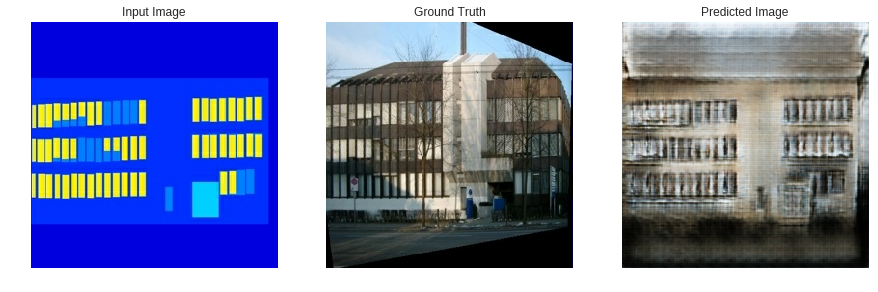

Time taken for epoch 40 is 71.53372240066528 sec

Time taken for epoch 41 is 66.44548606872559 sec

Time taken for epoch 42 is 66.23764300346375 sec

Time taken for epoch 43 is 66.21113634109497 sec

Time taken for epoch 44 is 66.1713171005249 sec

Time taken for epoch 45 is 66.22183418273926 sec

Time taken for epoch 46 is 66.22709131240845 sec

Time taken for epoch 47 is 66.16328477859497 sec

Time taken for epoch 48 is 66.09936165809631 sec

Time taken for epoch 49 is 66.08635783195496 sec

Time taken for epoch 50 is 66.06345391273499 sec

Time taken for epoch 51 is 66.13546562194824 sec

Time taken for epoch 52 is 66.17919278144836 sec

Time taken for epoch 53 is 66.21034097671509 sec

Time taken for epoch 54 is 66.15167546272278 sec

Time taken for epoch 55 is 66.25129818916321 sec

Time taken for epoch 56 is 66.184818983078 sec

Time taken for epoch 57 is 66.21038365364075 sec

Time taken for epoch 58 is 66.23915576934814 sec

Time taken for epoch 59 is 66.21798038482666 sec



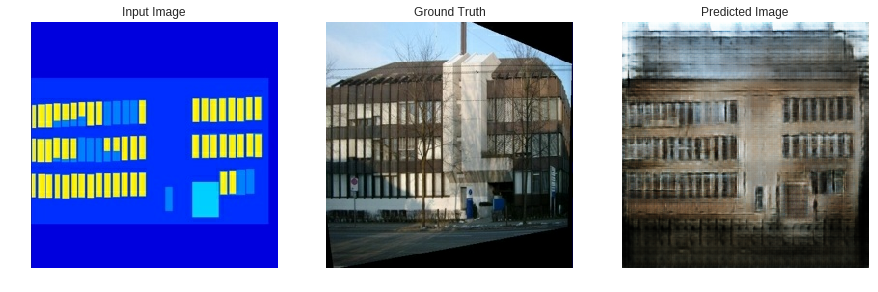

Time taken for epoch 60 is 71.24163150787354 sec

Time taken for epoch 61 is 66.50522828102112 sec

Time taken for epoch 62 is 66.34855890274048 sec

Time taken for epoch 63 is 66.17210865020752 sec

Time taken for epoch 64 is 66.25777268409729 sec

Time taken for epoch 65 is 66.30757427215576 sec

Time taken for epoch 66 is 66.28706121444702 sec

Time taken for epoch 67 is 66.27259802818298 sec

Time taken for epoch 68 is 66.23001170158386 sec

Time taken for epoch 69 is 66.26873779296875 sec

Time taken for epoch 70 is 66.19874691963196 sec

Time taken for epoch 71 is 66.24377679824829 sec

Time taken for epoch 72 is 66.29204821586609 sec

Time taken for epoch 73 is 66.20805406570435 sec

Time taken for epoch 74 is 66.19354915618896 sec

Time taken for epoch 75 is 66.22320199012756 sec

Time taken for epoch 76 is 66.24813580513 sec

Time taken for epoch 77 is 66.13401460647583 sec

Time taken for epoch 78 is 66.24614095687866 sec

Time taken for epoch 79 is 66.24220752716064 sec



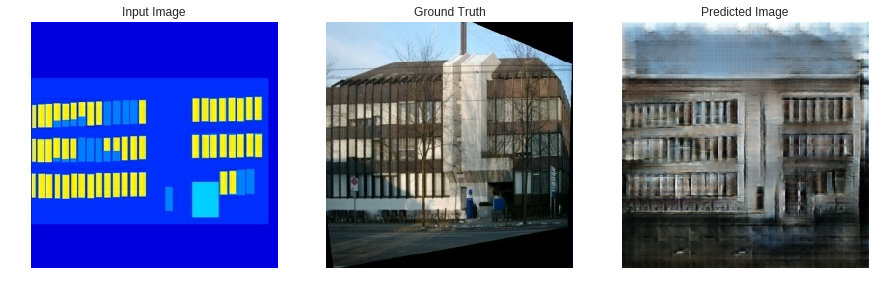

Time taken for epoch 80 is 70.89620518684387 sec

Time taken for epoch 81 is 66.50706076622009 sec

Time taken for epoch 82 is 66.1861674785614 sec

Time taken for epoch 83 is 66.23350024223328 sec

Time taken for epoch 84 is 66.23763060569763 sec

Time taken for epoch 85 is 66.26171040534973 sec

Time taken for epoch 86 is 66.24352502822876 sec

Time taken for epoch 87 is 66.28057551383972 sec

Time taken for epoch 88 is 66.14049887657166 sec

Time taken for epoch 89 is 66.2961266040802 sec

Time taken for epoch 90 is 66.24032211303711 sec

Time taken for epoch 91 is 66.25647163391113 sec

Time taken for epoch 92 is 66.36154127120972 sec

Time taken for epoch 93 is 66.35803818702698 sec

Time taken for epoch 94 is 66.35749411582947 sec

Time taken for epoch 95 is 66.31091833114624 sec

Time taken for epoch 96 is 66.23616743087769 sec

Time taken for epoch 97 is 66.36600518226624 sec

Time taken for epoch 98 is 66.23893857002258 sec

Time taken for epoch 99 is 66.24162864685059 sec



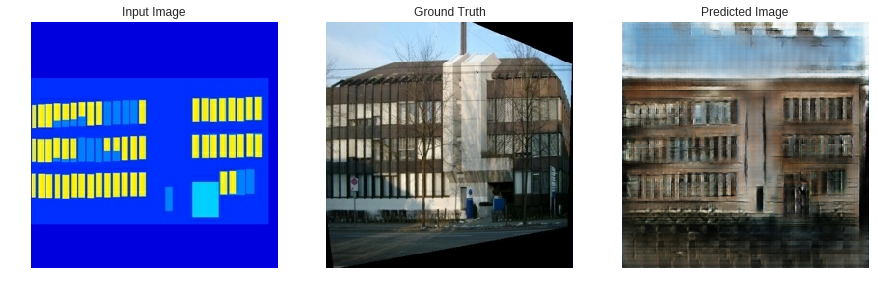

Time taken for epoch 100 is 70.96859192848206 sec

Time taken for epoch 101 is 66.56929278373718 sec

Time taken for epoch 102 is 66.22233462333679 sec

Time taken for epoch 103 is 66.14899754524231 sec

Time taken for epoch 104 is 66.18063855171204 sec

Time taken for epoch 105 is 66.13571453094482 sec

Time taken for epoch 106 is 66.22666883468628 sec

Time taken for epoch 107 is 66.13684272766113 sec

Time taken for epoch 108 is 66.22326469421387 sec

Time taken for epoch 109 is 66.21974873542786 sec

Time taken for epoch 110 is 66.20173740386963 sec

Time taken for epoch 111 is 66.25797772407532 sec

Time taken for epoch 112 is 66.27016615867615 sec

Time taken for epoch 113 is 66.25806069374084 sec

Time taken for epoch 114 is 66.18208956718445 sec

Time taken for epoch 115 is 66.17351293563843 sec

Time taken for epoch 116 is 66.22939920425415 sec

Time taken for epoch 117 is 66.12806367874146 sec

Time taken for epoch 118 is 66.17125368118286 sec

Time taken for epoch 119 is 66.

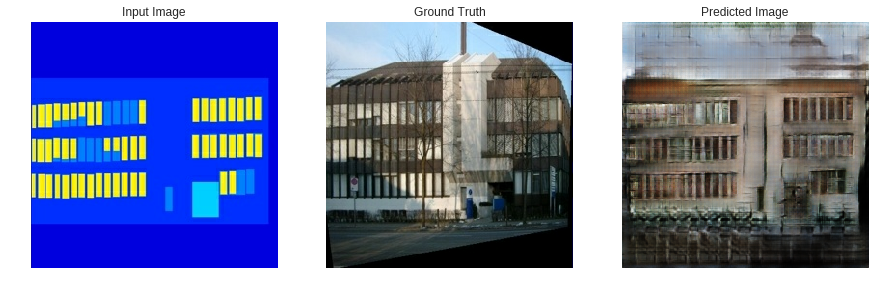

Time taken for epoch 120 is 70.93860387802124 sec

Time taken for epoch 121 is 66.51464891433716 sec

Time taken for epoch 122 is 66.25340151786804 sec

Time taken for epoch 123 is 66.13718676567078 sec

Time taken for epoch 124 is 66.1628189086914 sec

Time taken for epoch 125 is 66.27473187446594 sec

Time taken for epoch 126 is 66.1428427696228 sec

Time taken for epoch 127 is 66.25899815559387 sec

Time taken for epoch 128 is 66.22307658195496 sec

Time taken for epoch 129 is 66.15732288360596 sec

Time taken for epoch 130 is 66.26939058303833 sec

Time taken for epoch 131 is 66.27654767036438 sec

Time taken for epoch 132 is 66.31103610992432 sec

Time taken for epoch 133 is 66.3045711517334 sec

Time taken for epoch 134 is 66.23840022087097 sec

Time taken for epoch 135 is 66.2880129814148 sec

Time taken for epoch 136 is 66.25933575630188 sec

Time taken for epoch 137 is 66.22650694847107 sec

Time taken for epoch 138 is 66.24978947639465 sec

Time taken for epoch 139 is 66.2765

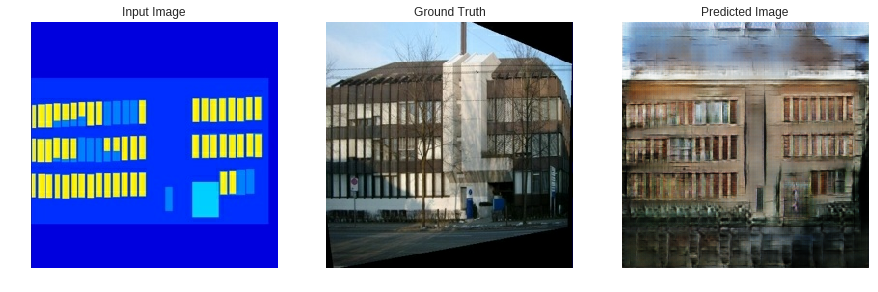

Time taken for epoch 140 is 70.96910333633423 sec

Time taken for epoch 141 is 66.56503057479858 sec

Time taken for epoch 142 is 66.15132093429565 sec

Time taken for epoch 143 is 66.13149213790894 sec

Time taken for epoch 144 is 66.20961236953735 sec

Time taken for epoch 145 is 66.27442455291748 sec

Time taken for epoch 146 is 66.29096913337708 sec

Time taken for epoch 147 is 66.29038834571838 sec

Time taken for epoch 148 is 66.22024583816528 sec

Time taken for epoch 149 is 66.21820259094238 sec

Time taken for epoch 150 is 66.22131633758545 sec

Time taken for epoch 151 is 66.22627687454224 sec

Time taken for epoch 152 is 66.19961428642273 sec

Time taken for epoch 153 is 66.18157267570496 sec

Time taken for epoch 154 is 66.20656204223633 sec

Time taken for epoch 155 is 66.14907598495483 sec

Time taken for epoch 156 is 66.25084352493286 sec

Time taken for epoch 157 is 66.23644423484802 sec

Time taken for epoch 158 is 66.21665287017822 sec

Time taken for epoch 159 is 66.

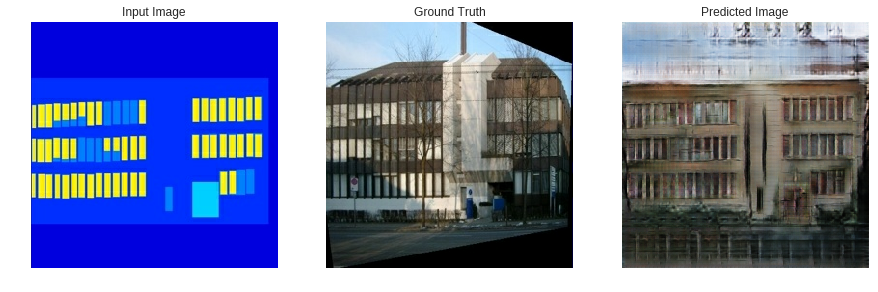

Time taken for epoch 160 is 70.88564777374268 sec

Time taken for epoch 161 is 66.39681935310364 sec

Time taken for epoch 162 is 66.2205331325531 sec

Time taken for epoch 163 is 66.2924861907959 sec

Time taken for epoch 164 is 66.27822494506836 sec

Time taken for epoch 165 is 66.31334018707275 sec

Time taken for epoch 166 is 66.29195761680603 sec

Time taken for epoch 167 is 66.27659153938293 sec

Time taken for epoch 168 is 66.33059811592102 sec

Time taken for epoch 169 is 66.22528839111328 sec

Time taken for epoch 170 is 66.25052809715271 sec

Time taken for epoch 171 is 66.17441082000732 sec

Time taken for epoch 172 is 66.29178237915039 sec

Time taken for epoch 173 is 66.21290230751038 sec

Time taken for epoch 174 is 66.1988034248352 sec

Time taken for epoch 175 is 66.22810673713684 sec

Time taken for epoch 176 is 66.19075393676758 sec

Time taken for epoch 177 is 66.26327133178711 sec

Time taken for epoch 178 is 66.25823616981506 sec

Time taken for epoch 179 is 66.296

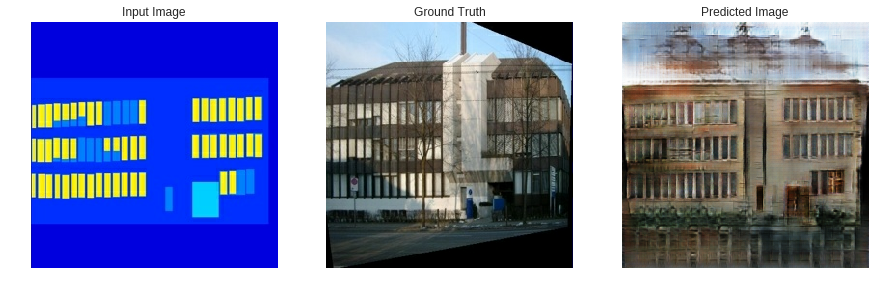

Time taken for epoch 180 is 70.92168378829956 sec

Time taken for epoch 181 is 66.61056351661682 sec

Time taken for epoch 182 is 66.24363493919373 sec

Time taken for epoch 183 is 66.19759225845337 sec

Time taken for epoch 184 is 66.14962410926819 sec

Time taken for epoch 185 is 66.1659665107727 sec

Time taken for epoch 186 is 66.10647010803223 sec

Time taken for epoch 187 is 66.16173243522644 sec

Time taken for epoch 188 is 66.17587757110596 sec

Time taken for epoch 189 is 66.14414930343628 sec

Time taken for epoch 190 is 66.08119511604309 sec

Time taken for epoch 191 is 66.27166175842285 sec

Time taken for epoch 192 is 66.25834107398987 sec

Time taken for epoch 193 is 66.37804365158081 sec

Time taken for epoch 194 is 66.17282199859619 sec

Time taken for epoch 195 is 66.2293632030487 sec

Time taken for epoch 196 is 66.22251844406128 sec

Time taken for epoch 197 is 66.17015767097473 sec

Time taken for epoch 198 is 66.30142664909363 sec

Time taken for epoch 199 is 66.30

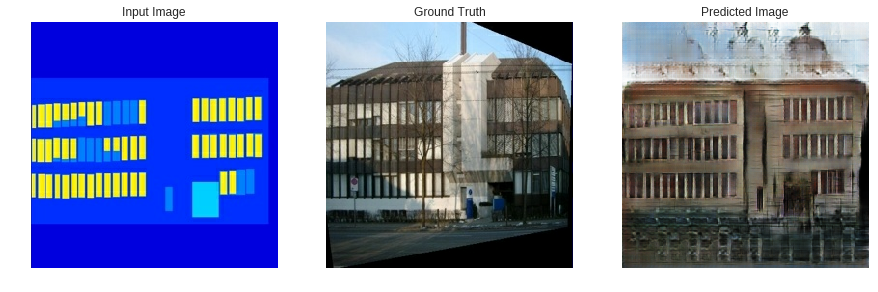

Time taken for epoch 200 is 70.90022015571594 sec

Time taken for epoch 201 is 66.44386029243469 sec

Time taken for epoch 202 is 66.25329852104187 sec

Time taken for epoch 203 is 66.14770936965942 sec

Time taken for epoch 204 is 66.23332405090332 sec

Time taken for epoch 205 is 66.18169903755188 sec

Time taken for epoch 206 is 66.20340538024902 sec

Time taken for epoch 207 is 66.2497079372406 sec

Time taken for epoch 208 is 66.18829393386841 sec

Time taken for epoch 209 is 66.11811351776123 sec

Time taken for epoch 210 is 66.19940733909607 sec

Time taken for epoch 211 is 66.17923045158386 sec

Time taken for epoch 212 is 66.37236499786377 sec

Time taken for epoch 213 is 66.16620397567749 sec

Time taken for epoch 214 is 66.24519515037537 sec

Time taken for epoch 215 is 66.24372673034668 sec

Time taken for epoch 216 is 66.32264614105225 sec

Time taken for epoch 217 is 66.24593925476074 sec

Time taken for epoch 218 is 66.32976222038269 sec

Time taken for epoch 219 is 66.2

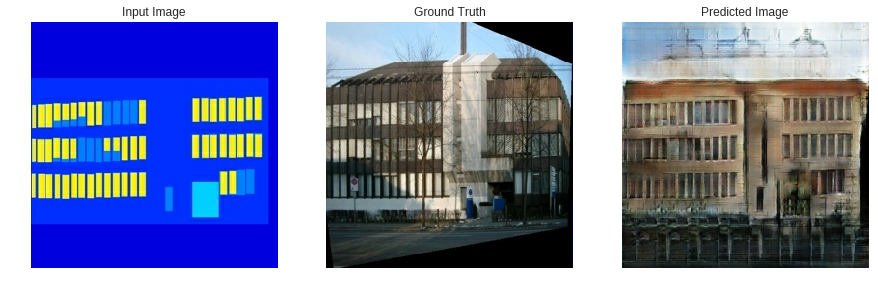

Time taken for epoch 220 is 71.10330176353455 sec

Time taken for epoch 221 is 66.68349552154541 sec

Time taken for epoch 222 is 66.25044965744019 sec

Time taken for epoch 223 is 66.24078321456909 sec

Time taken for epoch 224 is 66.27819061279297 sec

Time taken for epoch 225 is 66.22568798065186 sec

Time taken for epoch 226 is 66.26809048652649 sec

Time taken for epoch 227 is 66.19845032691956 sec

Time taken for epoch 228 is 66.27467060089111 sec

Time taken for epoch 229 is 66.24439287185669 sec

Time taken for epoch 230 is 66.14772701263428 sec

Time taken for epoch 231 is 66.15751647949219 sec

Time taken for epoch 232 is 66.26300978660583 sec

Time taken for epoch 233 is 66.24537491798401 sec

Time taken for epoch 234 is 66.17396926879883 sec

Time taken for epoch 235 is 66.35005354881287 sec

Time taken for epoch 236 is 66.22478818893433 sec

Time taken for epoch 237 is 66.04878520965576 sec

Time taken for epoch 238 is 66.52317643165588 sec

Time taken for epoch 239 is 66.

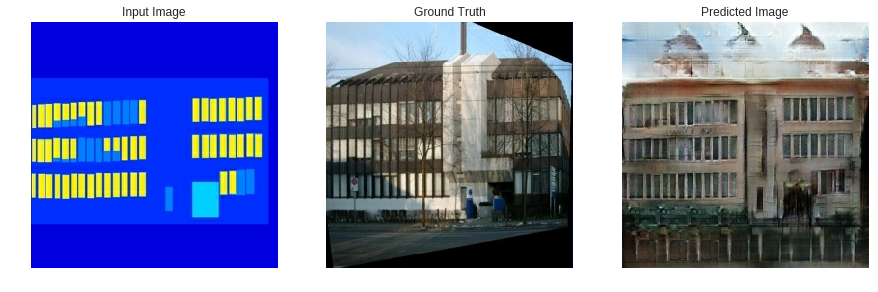

Time taken for epoch 240 is 71.02651500701904 sec

Time taken for epoch 241 is 66.44175434112549 sec

Time taken for epoch 242 is 66.18228197097778 sec

Time taken for epoch 243 is 66.22102451324463 sec

Time taken for epoch 244 is 66.130206823349 sec

Time taken for epoch 245 is 66.1764669418335 sec

Time taken for epoch 246 is 66.24521088600159 sec

Time taken for epoch 247 is 66.29130840301514 sec

Time taken for epoch 248 is 66.3313500881195 sec

Time taken for epoch 249 is 66.33659958839417 sec

Time taken for epoch 250 is 66.22411322593689 sec

Time taken for epoch 251 is 66.17932271957397 sec

Time taken for epoch 252 is 66.33096146583557 sec

Time taken for epoch 253 is 66.25289535522461 sec

Time taken for epoch 254 is 66.21401286125183 sec

Time taken for epoch 255 is 66.21777129173279 sec

Time taken for epoch 256 is 66.2683515548706 sec

Time taken for epoch 257 is 66.2704017162323 sec

Time taken for epoch 258 is 66.19513750076294 sec

Time taken for epoch 259 is 66.237514

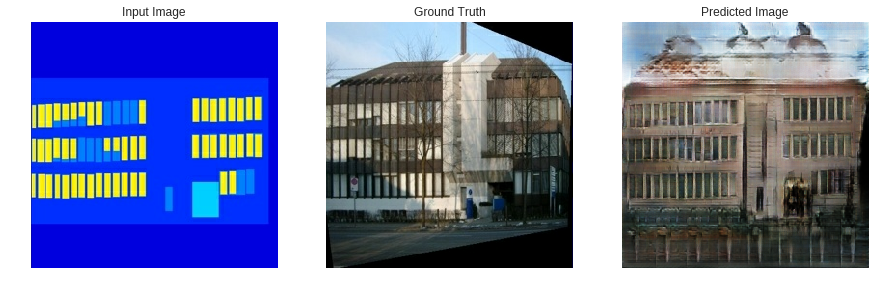

Time taken for epoch 260 is 71.06901502609253 sec

Time taken for epoch 261 is 66.53414726257324 sec

Time taken for epoch 262 is 66.38883876800537 sec

Time taken for epoch 263 is 66.28633832931519 sec

Time taken for epoch 264 is 66.16962051391602 sec

Time taken for epoch 265 is 66.31624555587769 sec

Time taken for epoch 266 is 66.235600233078 sec

Time taken for epoch 267 is 66.18905472755432 sec

Time taken for epoch 268 is 66.2369978427887 sec

Time taken for epoch 269 is 66.19230103492737 sec

Time taken for epoch 270 is 66.20929455757141 sec

Time taken for epoch 271 is 66.19115924835205 sec

Time taken for epoch 272 is 66.12958478927612 sec

Time taken for epoch 273 is 66.23702597618103 sec

Time taken for epoch 274 is 66.21483492851257 sec

Time taken for epoch 275 is 66.21085476875305 sec

Time taken for epoch 276 is 66.19972705841064 sec

Time taken for epoch 277 is 66.23807978630066 sec

Time taken for epoch 278 is 66.15726971626282 sec

Time taken for epoch 279 is 66.162

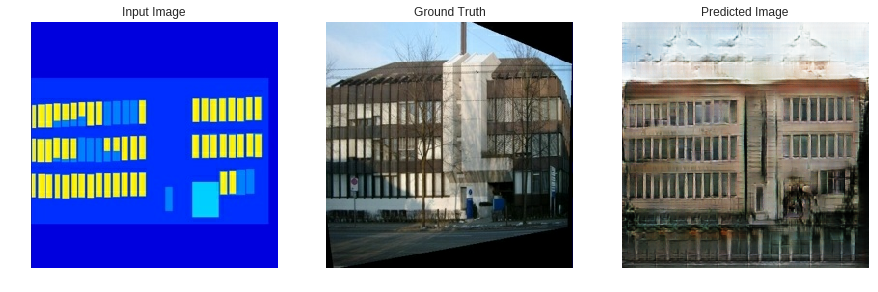

Time taken for epoch 280 is 70.84283494949341 sec

Time taken for epoch 281 is 66.52046704292297 sec

Time taken for epoch 282 is 66.1501715183258 sec

Time taken for epoch 283 is 66.19608688354492 sec

Time taken for epoch 284 is 66.17931246757507 sec

Time taken for epoch 285 is 66.2394163608551 sec

Time taken for epoch 286 is 66.2464165687561 sec

Time taken for epoch 287 is 66.26212930679321 sec

Time taken for epoch 288 is 66.21926999092102 sec

Time taken for epoch 289 is 66.20422291755676 sec

Time taken for epoch 290 is 66.28585720062256 sec

Time taken for epoch 291 is 66.2558810710907 sec

Time taken for epoch 292 is 66.19525909423828 sec

Time taken for epoch 293 is 66.14222574234009 sec

Time taken for epoch 294 is 66.1256628036499 sec

Time taken for epoch 295 is 66.50856471061707 sec

Time taken for epoch 296 is 66.19614124298096 sec

Time taken for epoch 297 is 66.19841694831848 sec

Time taken for epoch 298 is 66.26174211502075 sec

Time taken for epoch 299 is 66.31888

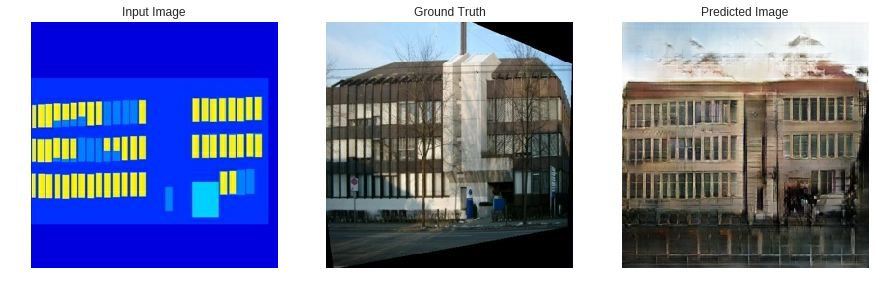

Time taken for epoch 300 is 71.14738583564758 sec



In [33]:
train(train_dataset, epochs=300)

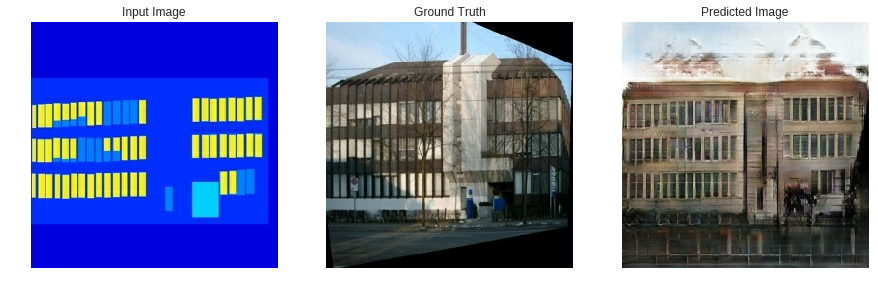

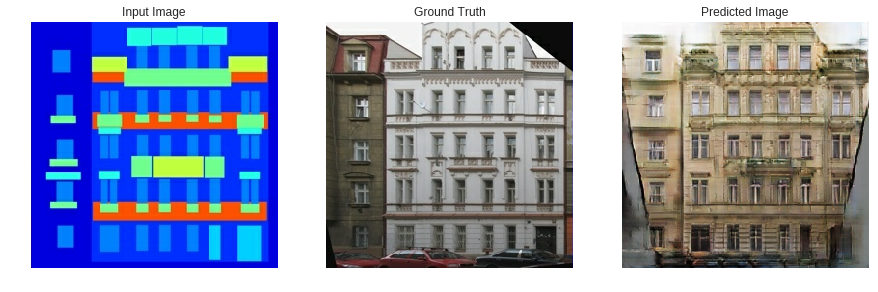

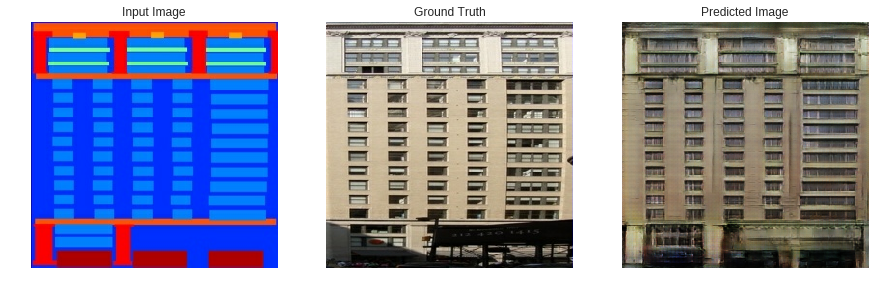

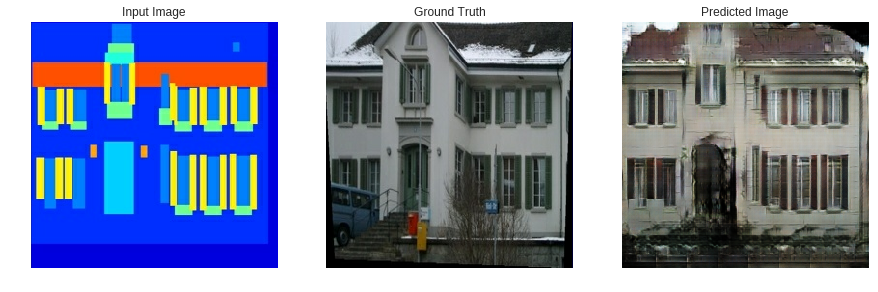

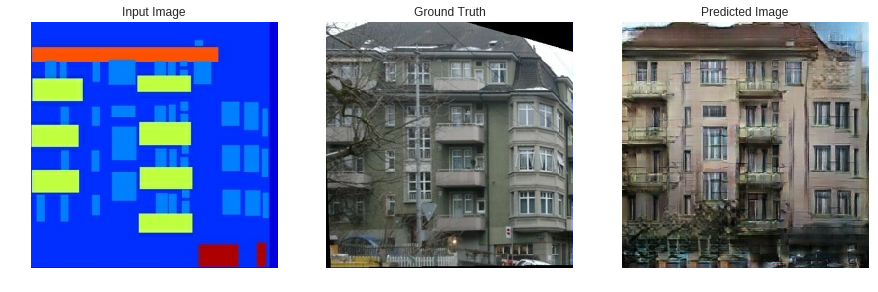

...

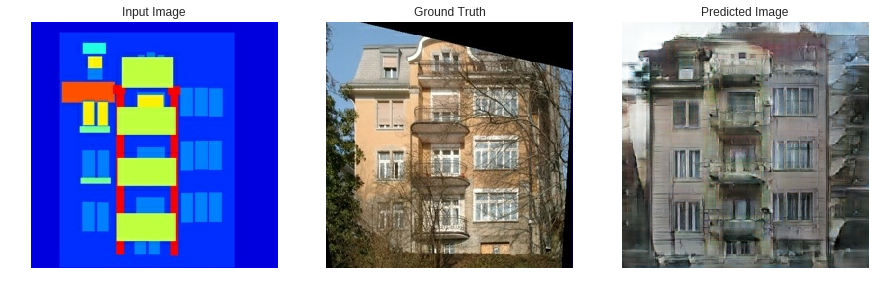

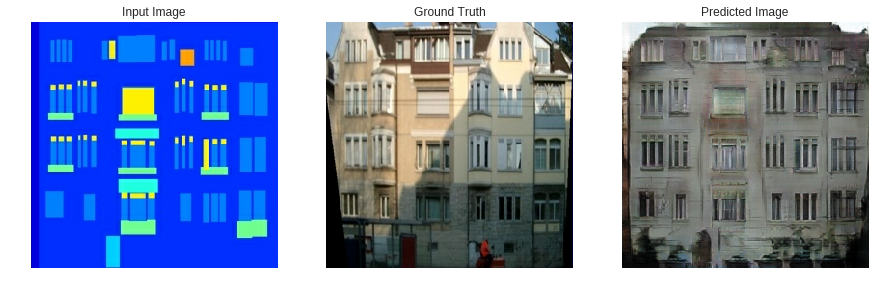

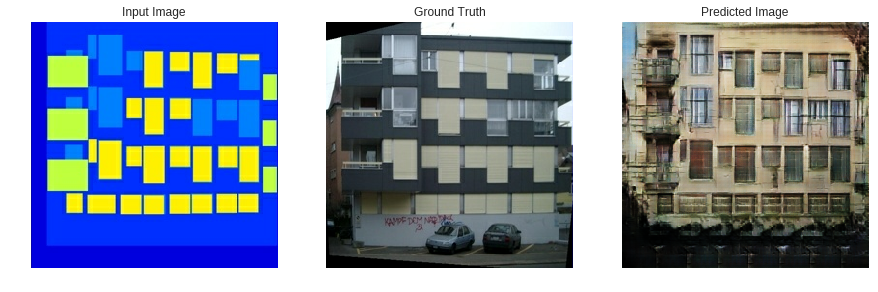

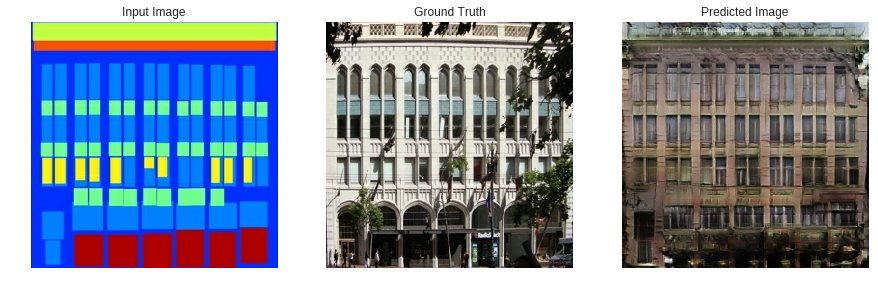

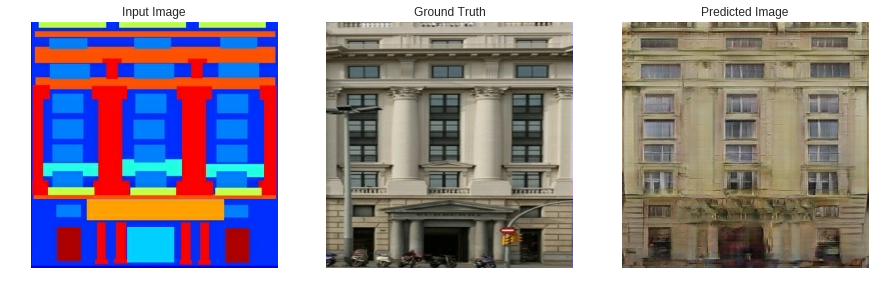

In [36]:
for inp, tar in test_dataset.take(20):
  generate_images(generator, inp, tar)